# 05 All Combined (Drum Resynthesis + Swing Aligned) 

In [1]:
import os
import sys
print(sys.version)

3.9.10 (main, Mar 17 2022, 21:35:59) 
[GCC 11.2.0]


In [2]:
import pickle as pkl

import numpy as np
import matplotlib.pyplot as plt

import torch
import librosa

from tqdm.auto import tqdm
from IPython.display import display, Audio

In [3]:
sys.path.append('COMMON_UTILS/')

In [4]:
from utils import plot_audio, play

from tempo_align import warpAudio, quantiseAudio

from drum_processor import getDownbeats
from drum_decomposition import getDecomposition, plotDecomposition, isolateSources

from wasserstein_transformations import SmoothTransition

from swing_align import alignSwing

In [5]:
plt.rcParams['figure.figsize'] = (15, 5)

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f'computing on {device}')

computing on cpu


In [6]:
def findDownbeats(p):
    try:
        with open(os.path.join(p, 'downbeats.pkl'), 'rb') as f:
            db = pkl.load(f)
        print('found downbeats.pkl')
    except FileNotFoundError:
        print('computing downbeats')
        db = getDownbeats(
            os.path.join(p, 'source.wav'), 
            transition_lambda=64, 
        )

        with open(os.path.join(p, 'downbeats.pkl'), 'wb') as f:
            pkl.dump(db, f)
            
    return db

#### 01 Select Targets

In [273]:
TRG = './PROCESSED/dem_bow/'
y_trg, sr = librosa.load(os.path.join(TRG, 'source.wav'), sr=44100)

ORG = './PROCESSED/house/'
y_org, _ = librosa.load(os.path.join(ORG, 'source.wav'), sr=sr)

print('TARGET:')
play(y_trg, sr)
print('ORIGINAL:')
play(y_org, sr)

TARGET:


ORIGINAL:


#### 02 Get Stems 

In [274]:
y_trg_drums, sr = librosa.load(os.path.join(TRG, 'DRUMS/drums.wav'), sr=sr)
y_org_drums, _ = librosa.load(os.path.join(ORG, 'DRUMS/drums.wav'), sr=sr)
y_org_full, _ = librosa.load(os.path.join(ORG, 'source.wav'), sr=sr)

In [275]:
stems = []
for s in ['vocals', 'bass', 'other']:
    y_ins, _ = librosa.load(os.path.join(ORG, s.upper(), f'{s}.wav'), sr=sr)
    stems.append(y_ins)
y_org_ins = np.sum(stems, axis=0)
play(y_org_ins, sr)

#### 03 Get Downbeats 

In [276]:
tempo_trg = librosa.beat.tempo(y=y_trg, sr=sr)
tempo_org = librosa.beat.tempo(y=y_org, sr=sr)
print(tempo_trg, tempo_org)

[99.38401442] [129.19921875]


In [277]:
db_org = findDownbeats(ORG)
db_trg = findDownbeats(TRG)

found downbeats.pkl
found downbeats.pkl


#### 04 Quantise Audio 

In [278]:
y_trg, _ = quantiseAudio(y_trg, sr, db_trg, hq=True)
y_org, _ = quantiseAudio(y_org, sr, db_org, hq=True)
y_trg_drums, db_trg = quantiseAudio(y_trg_drums, sr, db_trg, hq=True)
y_org_drums, db_org = quantiseAudio(y_org_drums, sr, db_org, hq=True)
y_org_ins, _  = quantiseAudio(y_org_ins, sr, db_org, hq=True)

#### 05 Sync Audio 

In [279]:
y_trg_warped, y_org_synced, downbeats, idxs_trg, idxs_org = warpAudio(
    y_trg_drums, y_org_drums, db_trg, db_org, sr
)

In [280]:
assert y_trg_warped.shape == y_org_synced.shape

In [281]:
y_ins_segment = y_org_ins[idxs_org[0]: idxs_org[1]]

#### 06 Decompose Drum Audio 

In [282]:
with open('./drum_templates.pkl', 'rb') as f:
    templates = pkl.load(f)
    
kd_temp = templates['kd_temp']
sd_temp = templates['sd_temp']
hh_temp = templates['hh_temp']

W_0 = np.stack([kd_temp, sd_temp, hh_temp], axis=1)
W_0 = torch.from_numpy(W_0).to(device)

In [283]:
W_trg, H_trg, V_trg, _, net_trg = getDecomposition(
    y_trg_warped, R=3, W=W_0, trainable_W=True, device=device,
)

In [284]:
W_org, H_org, V_org, _, net_org = getDecomposition(
    y_org_synced, R=3, W=W_0, trainable_W=True, device=device,
)

#### 07 Morph Activations 

In [285]:
sm = SmoothTransition(H_org, H_trg)

In [286]:
weight = 1.0

In [287]:
H_w = torch.from_numpy(sm(weight)).type(torch.float)
for i in range(len(H_org)):
    H_w[i] *= (H_org[i].max() / H_w[i].max())
    
V_w = net_org.reconstruct(
        net_org.W, H_w.unsqueeze(0)
    ).detach().cpu().squeeze().numpy()

#### 08 Reconstruct Audio 

In [288]:
y_w_drums = librosa.griffinlim(V_w)
if y_w_drums.max() > 1 or y_w_drums.min() < -1:
    y_w_drums /= max(y_w_drums.max(), -y_w_drums.min())
y_w_full = y_w_drums + np.copy(y_ins_segment[:len(y_w_drums)])

<AxesSubplot:>

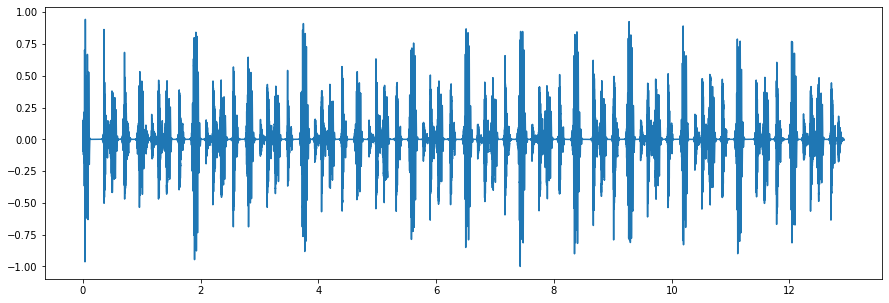

In [289]:
plot_audio(y_w_drums)

In [290]:
print(f'ORIGINAL with {weight:.0%} morphing:')
play(y_w_full, sr, normalize=True)
print(f'isolated resynthesised drums:')
play(y_w_drums, sr, normalize=True)

ORIGINAL with 100% morphing:


isolated resynthesised drums:


#### 09 Apply Swing 

In [291]:
from swing_align import getSwingPoints, getSwingMap, getSwingTimings
from tempo_align import matchAudioEvents

In [292]:
points_org = getSwingPoints(y_org, sr, db_org, hop_length=256)
points_trg = getSwingPoints(y_trg, sr, db_trg, hop_length=256)

map_ = getSwingMap(points_org, points_trg)
points_from, points_to = getSwingTimings(db_org, map_)

y_ins_warped = matchAudioEvents(y_org_ins, sr, points_from, points_to, hq=True)
y_ins_warped = y_ins_warped[idxs_org[0]:idxs_org[1]]

In [293]:
print(f'ORIGINAL INSTRUMENTATION:')
play(y_ins_segment, sr)
print(f'with swing applied:')
play(y_ins_warped, sr)

ORIGINAL INSTRUMENTATION:


with swing applied:


#### 10 Complete Style Transfer 

In [294]:
import pyrubberband

In [295]:
y_styled = y_w_drums + np.copy(y_ins_warped[:len(y_w_drums)])
y_styled_bpm = pyrubberband.pyrb.time_stretch(y_styled, sr, rate=(tempo_trg / tempo_org)[0])

In [296]:
print(f'ORIGINAL (aligned):')
play(y_org[idxs_org[0]:idxs_org[1]], sr)
print(f'Drum resynthesis + swing applied')
play(y_styled, sr, normalize=True)
print(f'at TRGs tempo {tempo_trg[0]:.0f}bpm')
play(y_styled_bpm, sr, normalize=True)

ORIGINAL (aligned):


Drum resynthesis + swing applied


at TRGs tempo 99bpm
